# Test Results on Scaling to Larger Models

The aim of this notebook is to illustrate some results on conducting Bayesian inference on Network FKPP models of varying complexity. Here, complexity is modified by changing the size of the network.

## Model setup


In [1]:
import netwin as nw 
from netwin.models import NetworkFKPP
from netwin import Model, VBModel, infer

import numpy as np 
import matplotlib.pyplot as plt

Firstly, we constract a network using $n$ random samples from a normal distribution. This is made so emulate an adjancency matrix by filling the diagonals with zeros. Values are normalised and made positive.

In [2]:
# size of network 
n = 5

# make network
A = np.reshape(np.random.normal(10, 20, n**2), (n, n))
np.fill_diagonal(A, 0)

# normalise and make positive
A = A / np.max(A)
A = np.positive(A)

Model is initialised with some intial values

In [3]:
m = NetworkFKPP(A)

# random values for initial node parameters
p = np.random.uniform(0,0.5,n)

# set the model parameters along with node parameters
u0 = np.append(p, [0.5, 3.0])

# define the time over which we wish to simulate
m.t = np.linspace(0,2,50)


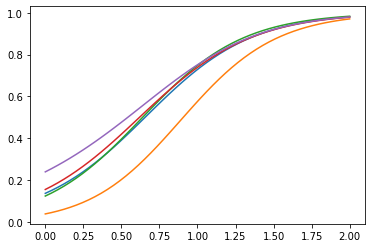

In [4]:
sim = m.forward(np.log(u0))

plt.plot(m.t, sim)
plt.show()

## Inference

We conduct infernece using analytic variational inference,using samples from the integration of the model as synthetic data. 

In [5]:
# set guess for initial node concentration
p0 = np.ones([n])

# append initial guess for model parameters
u_guess = np.append(p0, [1.0,1.0])

# Instantiate probablistic model of type VBModel
ProbModel = VBModel(model=m, data=sim, init_means=u_guess)

With the probablistic model initialised, we can optimise using the infer function and plot the Free energy convergence

Finished!


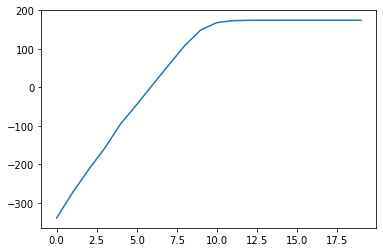

In [6]:
pm = infer(ProbModel)
plt.plot(pm.F())
plt.show()

Finally, we can plot the model parameters and initial node values to see whether we have accurate estimated parameters. 

In [7]:
from netwin import plot_2dmvn

plot_2dmvn(means=np.exp(pm.m()[-2:]), cov=pm.Cov()[-2:,-2:], n=100000)

In [ ]:
from netwin import barplot_concentrations
barplot_concentrations(true=p, inferred=np.exp(pm.m()[:-2]))